<a href="https://colab.research.google.com/github/ankanb84/medical-image-enhanchement-using-Deep-Learning/blob/main/medicalimageenhanchment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
# @title Cell 1: Setup and Kaggle API

import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import cv2 # OpenCV for image loading and processing
import os
import datetime
from google.colab import drive
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# --- Kaggle Hub Setup ---
try:
    import kagglehub
    print("kagglehub library found.")
except ImportError:
    print("kagglehub not found. Installing now...")
    !pip install kagglehub
    import kagglehub

# --- API Key Setup ---
# This assumes you have uploaded your kaggle.json file to the Colab files tab
if not os.path.exists("/root/.kaggle/kaggle.json"):
    print("\n--- Kaggle API Key Not Found. Setting up now. ---")
    print("Please upload your 'kaggle.json' file to the Colab file browser (left sidebar).")
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !chmod 600 ~/.kaggle/kaggle.json
    print("Kaggle API key set up.")
else:
    print("\nKaggle API key already set up.")


# Mount Google Drive
try:
    drive.mount('/content/drive', force_remount=True)
    print("Google Drive Mounted.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}.")
    raise ConnectionRefusedError("Google Drive not mounted. Cannot proceed.")


# --- Change the project name here ---
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
LOG_DIR = os.path.join(PROJECT_DIR, 'logs')
DATA_DIR = os.path.join(PROJECT_DIR, 'data')

os.makedirs(MODEL_SAVE_DIR, exist_ok=True)
os.makedirs(LOG_DIR, exist_ok=True)
os.makedirs(DATA_DIR, exist_ok=True)

print(f"\nProject directory: {PROJECT_DIR}")
print(f"Model save directory: {MODEL_SAVE_DIR}")
print(f"Logs directory: {LOG_DIR}")
print(f"Data directory: {DATA_DIR}")

# Set random seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
print("\nSetup complete.")

kagglehub library found.

--- Kaggle API Key Not Found. Setting up now. ---
Please upload your 'kaggle.json' file to the Colab file browser (left sidebar).
cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Kaggle API key set up.
Mounted at /content/drive
Google Drive Mounted.

Project directory: /content/drive/My Drive/MedicalImageEnhancementProject/
Model save directory: /content/drive/My Drive/MedicalImageEnhancementProject/models
Logs directory: /content/drive/My Drive/MedicalImageEnhancementProject/logs
Data directory: /content/drive/My Drive/MedicalImageEnhancementProject/data

Setup complete.


--- Data Handling: Downloading and Preprocessing Real Dataset ---


100%|██████████| 361M/361M [00:05<00:00, 72.0MB/s]

Extracting files...


Dataset downloaded to: /root/.cache/kagglehub/datasets/murtozalikhon/brain-tumor-multimodal-image-ct-and-mri/versions/1
Searching for image files in the downloaded dataset folders...

Found 9618 total images. Processing 1000 for training.
Processed 100 images...
Processed 200 images...
Processed 300 images...
Processed 400 images...
Processed 500 images...
Processed 600 images...
Processed 700 images...
Processed 800 images...
Processed 900 images...
Processed 1000 images...

Finished processing 1000 real image pairs.

Dataset split complete:
Train set: 800 | Validation set: 100 | Test set: 100 samples


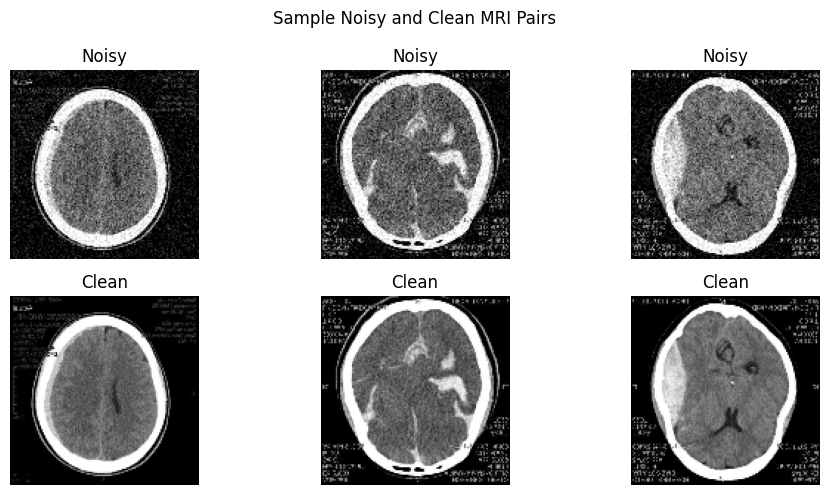

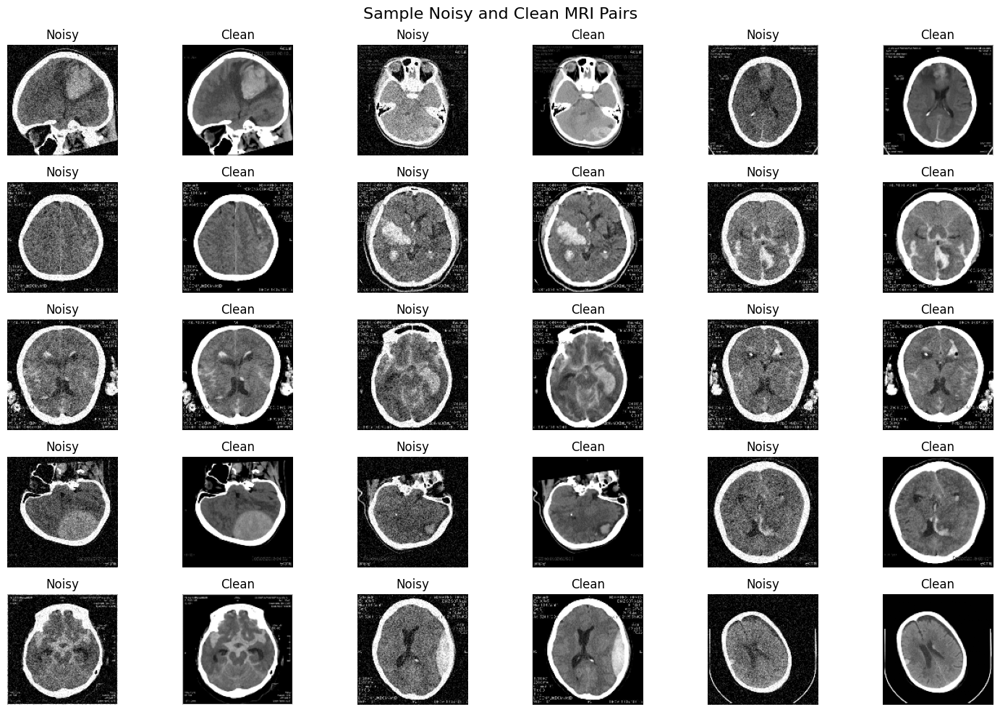

In [6]:
# @title Cell 2: Load and Preprocess Real Dataset

print("--- Data Handling: Downloading and Preprocessing Real Dataset ---")

# --- Configuration for this Cell ---
IMG_SIZE = 128
NUM_IMAGES_TO_PROCESS = 1000
NOISE_STD_DEV = 0.1
DATA_DOWNLOAD_DIR = os.path.join(DATA_DIR, 'raw_data_mri')
os.makedirs(DATA_DOWNLOAD_DIR, exist_ok=True)

# Function to add noise (must be defined here as it's used right below)
def add_gaussian_noise(image, mean=0, std=NOISE_STD_DEV):
    noise = np.random.normal(mean, std, image.shape).astype(np.float32)
    noisy_image = image + noise
    return np.clip(noisy_image, 0, 1)

# --- Download the Dataset ---
print("Downloading 'murtozalikhon/brain-tumor-multimodal-image-ct-and-mri'...")
# Note: The download path is now handled robustly by os.walk below
path = kagglehub.dataset_download("murtozalikhon/brain-tumor-multimodal-image-ct-and-mri")
print(f"Dataset downloaded to: {path}")


# --- Gather Image Paths (Robustly search for all images) ---
image_paths = []
print("Searching for image files in the downloaded dataset folders...")
# os.walk will traverse the entire directory tree
for root, dirs, files in os.walk(path):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(root, file))

if not image_paths:
    raise FileNotFoundError("No images found after a full directory search. Please check the dataset content.")

print(f"\nFound {len(image_paths)} total images. Processing {min(NUM_IMAGES_TO_PROCESS, len(image_paths))} for training.")

# --- Create Noisy/Clean Pairs ---
X_full = []
Y_full = []
for i, img_path in enumerate(image_paths[:NUM_IMAGES_TO_PROCESS]):
    clean_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if clean_img is None:
        continue
    clean_img = cv2.resize(clean_img, (IMG_SIZE, IMG_SIZE))
    clean_img = clean_img.astype(np.float32) / 255.0
    noisy_img = add_gaussian_noise(clean_img)
    X_full.append(np.expand_dims(noisy_img, axis=-1))
    Y_full.append(np.expand_dims(clean_img, axis=-1))
    if (i+1) % 100 == 0:
        print(f"Processed {i+1} images...")

X_full = np.array(X_full)
Y_full = np.array(Y_full)
print(f"\nFinished processing {len(X_full)} real image pairs.")

# --- Split the Dataset ---
X_train, X_temp, Y_train, Y_temp = train_test_split(X_full, Y_full, test_size=0.2, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size=0.5, random_state=42)
print(f"\nDataset split complete:")
print(f"Train set: {len(X_train)} | Validation set: {len(X_val)} | Test set: {len(X_test)} samples")

# Visualize a few samples to check
plt.figure(figsize=(10, 5))
for i in range(3):
    idx = np.random.randint(0, len(X_train))
    plt.subplot(2, 3, i + 1)
    plt.imshow(X_train[idx].squeeze(), cmap='gray')
    plt.title('Noisy')
    plt.axis('off')
    plt.subplot(2, 3, i + 4)
    plt.imshow(Y_train[idx].squeeze(), cmap='gray')
    plt.title('Clean')
    plt.axis('off')
plt.suptitle('Sample Noisy and Clean MRI Pairs')
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 10)) # Adjusted figure size for more subplots
num_samples_to_display = 15 # CHANGED: Now displays 15 samples
for i in range(num_samples_to_display):
    idx = np.random.randint(0, len(X_train))

    plt.subplot(5, 6, 2*i + 1) # Adjusted subplot grid (5 rows, 6 columns)
    plt.imshow(X_train[idx].squeeze(), cmap='gray')
    plt.title('Noisy')
    plt.axis('off')

    plt.subplot(5, 6, 2*i + 2) # Adjusted subplot grid
    plt.imshow(Y_train[idx].squeeze(), cmap='gray')
    plt.title('Clean')
    plt.axis('off')

plt.suptitle('Sample Noisy and Clean MRI Pairs', fontsize=16)
plt.tight_layout()
plt.show()

# ... (rest of your Cell 2 code remains unchanged) ...

In [4]:
# @title Cell 3: U-Net Model Definition

def unet_model(input_size=(IMG_SIZE, IMG_SIZE, 1)):
    inputs = layers.Input(input_size)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv4)
    drop4 = layers.Dropout(0.5)(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(drop4)
    conv5 = layers.Conv2D(512, 3, activation='relu', padding='same')(pool4)
    conv5 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv5)
    drop5 = layers.Dropout(0.5)(conv5)
    up6 = layers.Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(drop5)
    up6 = layers.concatenate([drop4, up6], axis=3)
    conv6 = layers.Conv2D(256, 3, activation='relu', padding='same')(up6)
    conv6 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv6)
    up7 = layers.Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv6)
    up7 = layers.concatenate([conv3, up7], axis=3)
    conv7 = layers.Conv2D(128, 3, activation='relu', padding='same')(up7)
    conv7 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv7)
    up8 = layers.Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv7)
    up8 = layers.concatenate([conv2, up8], axis=3)
    conv8 = layers.Conv2D(64, 3, activation='relu', padding='same')(up8)
    conv8 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv8)
    up9 = layers.Conv2DTranspose(32, 2, strides=(2, 2), padding='same')(conv8)
    up9 = layers.concatenate([conv1, up9], axis=3)
    conv9 = layers.Conv2D(32, 3, activation='relu', padding='same')(up9)
    conv9 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv9)
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv9)
    model = models.Model(inputs=inputs, outputs=outputs)
    return model
print("U-Net model definition complete.")

U-Net model definition complete.


In [5]:
# @title Cell 4: Model Compilation and Callbacks

# This assumes PSNRSIMCallback is defined in a previous cell
class PSNRSIMCallback(callbacks.Callback):
    def __init__(self, X_val, Y_val, data_range=1.0):
        super().__init__()
        self.X_val = X_val
        self.Y_val = Y_val
        self.data_range = data_range
        self.val_psnr_history = []
        self.val_ssim_history = []
    def on_epoch_end(self, epoch, logs=None):
        if logs is None: logs = {}
        y_pred = self.model.predict(self.X_val, verbose=0)
        batch_psnr = [psnr(self.Y_val[i].squeeze(), y_pred[i].squeeze(), data_range=self.data_range) for i in range(len(self.X_val))]
        batch_ssim = [ssim(self.Y_val[i].squeeze(), y_pred[i].squeeze(), data_range=self.data_range) for i in range(len(self.X_val))]
        avg_psnr = np.mean(batch_psnr)
        avg_ssim = np.mean(batch_ssim)
        self.val_psnr_history.append(avg_psnr)
        self.val_ssim_history.append(avg_ssim)
        logs['val_psnr'] = avg_psnr
        logs['val_ssim'] = avg_ssim
        print(f" - val_psnr: {avg_psnr:.4f} - val_ssim: {avg_ssim:.4f}")

# --- Define the U-Net Model ---
def unet_model(input_size=(128, 128, 1)):
    inputs = layers.Input(input_size)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv4)
    drop4 = layers.Dropout(0.5)(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(drop4)
    conv5 = layers.Conv2D(512, 3, activation='relu', padding='same')(pool4)
    conv5 = layers.Conv2D(512, 3, activation='relu', padding='same')(conv5)
    drop5 = layers.Dropout(0.5)(conv5)
    up6 = layers.Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(drop5)
    up6 = layers.concatenate([drop4, up6], axis=3)
    conv6 = layers.Conv2D(256, 3, activation='relu', padding='same')(up6)
    conv6 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv6)
    up7 = layers.Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv6)
    up7 = layers.concatenate([conv3, up7], axis=3)
    conv7 = layers.Conv2D(128, 3, activation='relu', padding='same')(up7)
    conv7 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv7)
    up8 = layers.Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv7)
    up8 = layers.concatenate([conv2, up8], axis=3)
    conv8 = layers.Conv2D(64, 3, activation='relu', padding='same')(up8)
    conv8 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv8)
    up9 = layers.Conv2DTranspose(32, 2, strides=(2, 2), padding='same')(conv8)
    up9 = layers.concatenate([conv1, up9], axis=3)
    conv9 = layers.Conv2D(32, 3, activation='relu', padding='same')(up9)
    conv9 = layers.Conv2D(32, 3, activation='relu', padding='same')(conv9)
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv9)
    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# --- Configuration ---
LEARNING_RATE = 1e-4
BATCH_SIZE = 16
EPOCHS = 50
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

model = unet_model(input_size=(IMG_SIZE, IMG_SIZE, 1))
model.compile(optimizer=optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse', metrics=['mse', 'mae'])
print("U-Net model compiled.")

# --- Callbacks ---
checkpoint = callbacks.ModelCheckpoint(filepath=checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
tensorboard_callback = callbacks.TensorBoard(log_dir=os.path.join(LOG_DIR, datetime.datetime.now().strftime("%Y%m%d-%H%M%S")), histogram_freq=1)
psnr_ssim_callback = PSNRSIMCallback(X_val, Y_val)
callbacks_list = [checkpoint, early_stopping, tensorboard_callback, psnr_ssim_callback]

print("Callbacks configured successfully.")

U-Net model compiled.
Callbacks configured successfully.


In [6]:
class PSNRSIMCallback(callbacks.Callback):
    def __init__(self, X_val, Y_val, data_range=1.0):
        super().__init__()
        self.X_val = X_val
        self.Y_val = Y_val
        self.data_range = data_range
        self.val_psnr_history = []
        self.val_ssim_history = []
    def on_epoch_end(self, epoch, logs=None):
        if logs is None: logs = {}
        y_pred = self.model.predict(self.X_val, verbose=0)
        batch_psnr = [psnr(self.Y_val[i].squeeze(), y_pred[i].squeeze(), data_range=self.data_range) for i in range(len(self.X_val))]
        batch_ssim = [ssim(self.Y_val[i].squeeze(), y_pred[i].squeeze(), data_range=self.data_range) for i in range(len(self.X_val))]
        avg_psnr = np.mean(batch_psnr)
        avg_ssim = np.mean(batch_ssim)
        self.val_psnr_history.append(avg_psnr)
        self.val_ssim_history.append(avg_ssim)
        logs['val_psnr'] = avg_psnr
        logs['val_ssim'] = avg_ssim
        print(f" - val_psnr: {avg_psnr:.4f} - val_ssim: {avg_ssim:.4f}")

LEARNING_RATE = 1e-4
BATCH_SIZE = 16
EPOCHS = 50
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

model = unet_model(input_size=(IMG_SIZE, IMG_SIZE, 1))
model.compile(optimizer=optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse', metrics=['mse', 'mae'])
print("U-Net model compiled.")

checkpoint = callbacks.ModelCheckpoint(filepath=checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min', verbose=1)
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
tensorboard_callback = callbacks.TensorBoard(log_dir=os.path.join(LOG_DIR, datetime.datetime.now().strftime("%Y%m%d-%H%M%S")), histogram_freq=1)
psnr_ssim_callback = PSNRSIMCallback(X_val, Y_val)
callbacks_list = [checkpoint, early_stopping, tensorboard_callback, psnr_ssim_callback]

print("Callbacks configured successfully.")

U-Net model compiled.
Callbacks configured successfully.


In [7]:
# @title Cell 5: Train the Model

print("\n--- Training the Model ---")
print(f"Training started for {EPOCHS} epochs with batch size {BATCH_SIZE}...")
history = model.fit(X_train, Y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_data=(X_val, Y_val), callbacks=callbacks_list, verbose=1)
print("\nModel training complete.")


--- Training the Model ---
Training started for 50 epochs with batch size 16...
Epoch 1/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.1421 - mae: 0.3284 - mse: 0.1421
Epoch 1: val_loss improved from inf to 0.03646, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 14.4098 - val_ssim: 0.3205
50/50 ━━━━━━━━━━━━━━━━━━━━ 47s 448ms/step - loss: 0.1417 - mae: 0.3278 - mse: 0.1417 - val_loss: 0.0365 - val_mae: 0.1585 - val_mse: 0.0365 - val_psnr: 14.4098 - val_ssim: 0.3205
Epoch 2/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0275 - mae: 0.1180 - mse: 0.0275
Epoch 2: val_loss improved from 0.03646 to 0.02088, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 16.9079 - val_ssim: 0.4474
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0274 - mae: 0.1177 - mse: 0.0274 - val_loss: 0.0209 - val_mae: 0.1037 - val_mse: 0.0209 - val_psnr: 16.9079 - val_ssim: 0.4474
Epoch 3/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0165 - mae: 0.0832 - mse: 0.0165
Epoch 3: val_loss improved from 0.02088 to 0.01695, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 17.8755 - val_ssim: 0.4943
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0165 - mae: 0.0832 - mse: 0.0165 - val_loss: 0.0170 - val_mae: 0.0920 - val_mse: 0.0170 - val_psnr: 17.8755 - val_ssim: 0.4943
Epoch 4/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0131 - mae: 0.0736 - mse: 0.0131
Epoch 4: val_loss improved from 0.01695 to 0.01587, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 18.1743 - val_ssim: 0.5203
50/50 ━━━━━━━━━━━━━━━━━━━━ 14s 219ms/step - loss: 0.0131 - mae: 0.0735 - mse: 0.0131 - val_loss: 0.0159 - val_mae: 0.0919 - val_mse: 0.0159 - val_psnr: 18.1743 - val_ssim: 0.5203
Epoch 5/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0110 - mae: 0.0678 - mse: 0.0110
Epoch 5: val_loss improved from 0.01587 to 0.01311, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 19.0293 - val_ssim: 0.5552
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 173ms/step - loss: 0.0110 - mae: 0.0677 - mse: 0.0110 - val_loss: 0.0131 - val_mae: 0.0826 - val_mse: 0.0131 - val_psnr: 19.0293 - val_ssim: 0.5552
Epoch 6/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0094 - mae: 0.0628 - mse: 0.0094
Epoch 6: val_loss improved from 0.01311 to 0.01050, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 20.0273 - val_ssim: 0.6015
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.0094 - mae: 0.0628 - mse: 0.0094 - val_loss: 0.0105 - val_mae: 0.0720 - val_mse: 0.0105 - val_psnr: 20.0273 - val_ssim: 0.6015
Epoch 7/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0083 - mae: 0.0589 - mse: 0.0083
Epoch 7: val_loss improved from 0.01050 to 0.01004, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 20.1956 - val_ssim: 0.6235
50/50 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0083 - mae: 0.0589 - mse: 0.0083 - val_loss: 0.0100 - val_mae: 0.0708 - val_mse: 0.0100 - val_psnr: 20.1956 - val_ssim: 0.6235
Epoch 8/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0074 - mae: 0.0558 - mse: 0.0074
Epoch 8: val_loss improved from 0.01004 to 0.00837, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 21.0088 - val_ssim: 0.6634
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - loss: 0.0074 - mae: 0.0558 - mse: 0.0074 - val_loss: 0.0084 - val_mae: 0.0631 - val_mse: 0.0084 - val_psnr: 21.0088 - val_ssim: 0.6634
Epoch 9/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0067 - mae: 0.0536 - mse: 0.0067
Epoch 9: val_loss improved from 0.00837 to 0.00719, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 21.6746 - val_ssim: 0.6897
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 192ms/step - loss: 0.0067 - mae: 0.0536 - mse: 0.0067 - val_loss: 0.0072 - val_mae: 0.0580 - val_mse: 0.0072 - val_psnr: 21.6746 - val_ssim: 0.6897
Epoch 10/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0062 - mae: 0.0521 - mse: 0.0062
Epoch 10: val_loss improved from 0.00719 to 0.00655, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 22.0715 - val_ssim: 0.7068
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - loss: 0.0062 - mae: 0.0521 - mse: 0.0062 - val_loss: 0.0066 - val_mae: 0.0553 - val_mse: 0.0066 - val_psnr: 22.0715 - val_ssim: 0.7068
Epoch 11/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0059 - mae: 0.0507 - mse: 0.0059
Epoch 11: val_loss improved from 0.00655 to 0.00611, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 22.3657 - val_ssim: 0.7201
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.0059 - mae: 0.0507 - mse: 0.0059 - val_loss: 0.0061 - val_mae: 0.0534 - val_mse: 0.0061 - val_psnr: 22.3657 - val_ssim: 0.7201
Epoch 12/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0055 - mae: 0.0495 - mse: 0.0055
Epoch 12: val_loss improved from 0.00611 to 0.00574, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 22.6276 - val_ssim: 0.7299
50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 148ms/step - loss: 0.0055 - mae: 0.0495 - mse: 0.0055 - val_loss: 0.0057 - val_mae: 0.0518 - val_mse: 0.0057 - val_psnr: 22.6276 - val_ssim: 0.7299
Epoch 13/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0052 - mae: 0.0484 - mse: 0.0052
Epoch 13: val_loss improved from 0.00574 to 0.00550, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 22.8022 - val_ssim: 0.7367
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.0052 - mae: 0.0484 - mse: 0.0052 - val_loss: 0.0055 - val_mae: 0.0508 - val_mse: 0.0055 - val_psnr: 22.8022 - val_ssim: 0.7367
Epoch 14/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0050 - mae: 0.0473 - mse: 0.0050
Epoch 14: val_loss improved from 0.00550 to 0.00511, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 23.1202 - val_ssim: 0.7446
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0050 - mae: 0.0473 - mse: 0.0050 - val_loss: 0.0051 - val_mae: 0.0489 - val_mse: 0.0051 - val_psnr: 23.1202 - val_ssim: 0.7446
Epoch 15/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0047 - mae: 0.0463 - mse: 0.0047
Epoch 15: val_loss improved from 0.00511 to 0.00482, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 23.3615 - val_ssim: 0.7515
50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0047 - mae: 0.0463 - mse: 0.0047 - val_loss: 0.0048 - val_mae: 0.0475 - val_mse: 0.0048 - val_psnr: 23.3615 - val_ssim: 0.7515
Epoch 16/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0045 - mae: 0.0452 - mse: 0.0045
Epoch 16: val_loss improved from 0.00482 to 0.00463, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 23.5307 - val_ssim: 0.7537
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.0045 - mae: 0.0452 - mse: 0.0045 - val_loss: 0.0046 - val_mae: 0.0467 - val_mse: 0.0046 - val_psnr: 23.5307 - val_ssim: 0.7537
Epoch 17/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0043 - mae: 0.0444 - mse: 0.0043
Epoch 17: val_loss improved from 0.00463 to 0.00443, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 23.7234 - val_ssim: 0.7629
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0043 - mae: 0.0444 - mse: 0.0043 - val_loss: 0.0044 - val_mae: 0.0454 - val_mse: 0.0044 - val_psnr: 23.7234 - val_ssim: 0.7629
Epoch 18/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0042 - mae: 0.0434 - mse: 0.0042
Epoch 18: val_loss improved from 0.00443 to 0.00436, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 23.7882 - val_ssim: 0.7633
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.0042 - mae: 0.0434 - mse: 0.0042 - val_loss: 0.0044 - val_mae: 0.0449 - val_mse: 0.0044 - val_psnr: 23.7882 - val_ssim: 0.7633
Epoch 19/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0040 - mae: 0.0426 - mse: 0.0040
Epoch 19: val_loss improved from 0.00436 to 0.00429, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 23.8559 - val_ssim: 0.7651
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - loss: 0.0040 - mae: 0.0425 - mse: 0.0040 - val_loss: 0.0043 - val_mae: 0.0444 - val_mse: 0.0043 - val_psnr: 23.8559 - val_ssim: 0.7651
Epoch 20/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0039 - mae: 0.0417 - mse: 0.0039
Epoch 20: val_loss improved from 0.00429 to 0.00393, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 24.2395 - val_ssim: 0.7765
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0039 - mae: 0.0417 - mse: 0.0039 - val_loss: 0.0039 - val_mae: 0.0422 - val_mse: 0.0039 - val_psnr: 24.2395 - val_ssim: 0.7765
Epoch 21/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0038 - mae: 0.0410 - mse: 0.0038
Epoch 21: val_loss did not improve from 0.00393
 - val_psnr: 24.2250 - val_ssim: 0.7741
50/50 ━━━━━━━━━━━━━━━━━━━━ 6s 126ms/step - loss: 0.0038 - mae: 0.0410 - mse: 0.0038 - val_loss: 0.0039 - val_mae: 0.0422 - val_mse: 0.0039 - val_psnr: 24.2250 - val_ssim: 0.7741
Epoch 22/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0036 - mae: 0.0400 - mse: 0.0036
Epoch 22: val_loss improved from 0.00393 to 0.00371, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 24.4906 - val_ssim: 0.7833
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0036 - mae: 0.0400 - mse: 0.0036 - val_loss: 0.0037 - val_mae: 0.0405 - val_mse: 0.0037 - val_psnr: 24.4906 - val_ssim: 0.7833
Epoch 23/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0035 - mae: 0.0393 - mse: 0.0035
Epoch 23: val_loss improved from 0.00371 to 0.00362, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 24.5926 - val_ssim: 0.7861
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.0035 - mae: 0.0393 - mse: 0.0035 - val_loss: 0.0036 - val_mae: 0.0398 - val_mse: 0.0036 - val_psnr: 24.5926 - val_ssim: 0.7861
Epoch 24/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0034 - mae: 0.0385 - mse: 0.0034
Epoch 24: val_loss improved from 0.00362 to 0.00359, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 24.6345 - val_ssim: 0.7867
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0034 - mae: 0.0385 - mse: 0.0034 - val_loss: 0.0036 - val_mae: 0.0395 - val_mse: 0.0036 - val_psnr: 24.6345 - val_ssim: 0.7867
Epoch 25/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0033 - mae: 0.0378 - mse: 0.0033
Epoch 25: val_loss improved from 0.00359 to 0.00341, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 24.8555 - val_ssim: 0.7931
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - loss: 0.0033 - mae: 0.0378 - mse: 0.0033 - val_loss: 0.0034 - val_mae: 0.0382 - val_mse: 0.0034 - val_psnr: 24.8555 - val_ssim: 0.7931
Epoch 26/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0032 - mae: 0.0373 - mse: 0.0032
Epoch 26: val_loss improved from 0.00341 to 0.00333, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 24.9595 - val_ssim: 0.7949
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0032 - mae: 0.0373 - mse: 0.0032 - val_loss: 0.0033 - val_mae: 0.0376 - val_mse: 0.0033 - val_psnr: 24.9595 - val_ssim: 0.7949
Epoch 27/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0032 - mae: 0.0367 - mse: 0.0032
Epoch 27: val_loss improved from 0.00333 to 0.00326, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.0620 - val_ssim: 0.7987
50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 173ms/step - loss: 0.0032 - mae: 0.0367 - mse: 0.0032 - val_loss: 0.0033 - val_mae: 0.0369 - val_mse: 0.0033 - val_psnr: 25.0620 - val_ssim: 0.7987
Epoch 28/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0031 - mae: 0.0362 - mse: 0.0031
Epoch 28: val_loss improved from 0.00326 to 0.00320, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.1375 - val_ssim: 0.8016
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.0031 - mae: 0.0362 - mse: 0.0031 - val_loss: 0.0032 - val_mae: 0.0365 - val_mse: 0.0032 - val_psnr: 25.1375 - val_ssim: 0.8016
Epoch 29/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0030 - mae: 0.0357 - mse: 0.0030
Epoch 29: val_loss improved from 0.00320 to 0.00312, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.2550 - val_ssim: 0.8046
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0030 - mae: 0.0357 - mse: 0.0030 - val_loss: 0.0031 - val_mae: 0.0358 - val_mse: 0.0031 - val_psnr: 25.2550 - val_ssim: 0.8046
Epoch 30/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0030 - mae: 0.0353 - mse: 0.0030
Epoch 30: val_loss improved from 0.00312 to 0.00308, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.3028 - val_ssim: 0.8065
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - loss: 0.0030 - mae: 0.0353 - mse: 0.0030 - val_loss: 0.0031 - val_mae: 0.0355 - val_mse: 0.0031 - val_psnr: 25.3028 - val_ssim: 0.8065
Epoch 31/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0029 - mae: 0.0349 - mse: 0.0029
Epoch 31: val_loss improved from 0.00308 to 0.00298, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.4584 - val_ssim: 0.8111
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 138ms/step - loss: 0.0029 - mae: 0.0349 - mse: 0.0029 - val_loss: 0.0030 - val_mae: 0.0348 - val_mse: 0.0030 - val_psnr: 25.4584 - val_ssim: 0.8111
Epoch 32/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0029 - mae: 0.0345 - mse: 0.0029
Epoch 32: val_loss improved from 0.00298 to 0.00296, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.4870 - val_ssim: 0.8120
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.0029 - mae: 0.0345 - mse: 0.0029 - val_loss: 0.0030 - val_mae: 0.0345 - val_mse: 0.0030 - val_psnr: 25.4870 - val_ssim: 0.8120
Epoch 33/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0028 - mae: 0.0341 - mse: 0.0028
Epoch 33: val_loss improved from 0.00296 to 0.00294, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.5224 - val_ssim: 0.8150
50/50 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0028 - mae: 0.0341 - mse: 0.0028 - val_loss: 0.0029 - val_mae: 0.0342 - val_mse: 0.0029 - val_psnr: 25.5224 - val_ssim: 0.8150
Epoch 34/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0028 - mae: 0.0338 - mse: 0.0028
Epoch 34: val_loss improved from 0.00294 to 0.00283, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.6770 - val_ssim: 0.8176
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 137ms/step - loss: 0.0028 - mae: 0.0338 - mse: 0.0028 - val_loss: 0.0028 - val_mae: 0.0336 - val_mse: 0.0028 - val_psnr: 25.6770 - val_ssim: 0.8176
Epoch 35/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0028 - mae: 0.0334 - mse: 0.0028
Epoch 35: val_loss improved from 0.00283 to 0.00281, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.7219 - val_ssim: 0.8191
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.0028 - mae: 0.0334 - mse: 0.0028 - val_loss: 0.0028 - val_mae: 0.0333 - val_mse: 0.0028 - val_psnr: 25.7219 - val_ssim: 0.8191
Epoch 36/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0027 - mae: 0.0331 - mse: 0.0027
Epoch 36: val_loss improved from 0.00281 to 0.00276, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.7980 - val_ssim: 0.8213
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 140ms/step - loss: 0.0027 - mae: 0.0331 - mse: 0.0027 - val_loss: 0.0028 - val_mae: 0.0329 - val_mse: 0.0028 - val_psnr: 25.7980 - val_ssim: 0.8213
Epoch 37/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0027 - mae: 0.0328 - mse: 0.0027
Epoch 37: val_loss improved from 0.00276 to 0.00273, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.8372 - val_ssim: 0.8225
50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0027 - mae: 0.0328 - mse: 0.0027 - val_loss: 0.0027 - val_mae: 0.0327 - val_mse: 0.0027 - val_psnr: 25.8372 - val_ssim: 0.8225
Epoch 38/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0027 - mae: 0.0325 - mse: 0.0027
Epoch 38: val_loss improved from 0.00273 to 0.00273, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.8501 - val_ssim: 0.8240
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 137ms/step - loss: 0.0027 - mae: 0.0325 - mse: 0.0027 - val_loss: 0.0027 - val_mae: 0.0325 - val_mse: 0.0027 - val_psnr: 25.8501 - val_ssim: 0.8240
Epoch 39/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0026 - mae: 0.0322 - mse: 0.0026
Epoch 39: val_loss improved from 0.00273 to 0.00270, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 25.8879 - val_ssim: 0.8251
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 137ms/step - loss: 0.0026 - mae: 0.0322 - mse: 0.0026 - val_loss: 0.0027 - val_mae: 0.0323 - val_mse: 0.0027 - val_psnr: 25.8879 - val_ssim: 0.8251
Epoch 40/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0026 - mae: 0.0319 - mse: 0.0026
Epoch 40: val_loss did not improve from 0.00270
 - val_psnr: 25.8405 - val_ssim: 0.8261
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 134ms/step - loss: 0.0026 - mae: 0.0319 - mse: 0.0026 - val_loss: 0.0027 - val_mae: 0.0323 - val_mse: 0.0027 - val_psnr: 25.8405 - val_ssim: 0.8261
Epoch 41/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0026 - mae: 0.0317 - mse: 0.0026
Epoch 41: val_loss did not improve from 0.00270
 - val_psnr: 25.8087 - val_ssim: 0.8266
50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - loss: 0.0026 - mae: 0.0317 - mse: 0.0026 - val_loss: 0.0028 - val_mae: 0.0323 - val_mse: 0.0028 - val_psnr: 25.8087 - val_ssim: 0.8266
Epoch 42/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - los

 - val_psnr: 25.9182 - val_ssim: 0.8298
50/50 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0025 - mae: 0.0313 - mse: 0.0025 - val_loss: 0.0027 - val_mae: 0.0317 - val_mse: 0.0027 - val_psnr: 25.9182 - val_ssim: 0.8298
Epoch 44/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0025 - mae: 0.0311 - mse: 0.0025
Epoch 44: val_loss did not improve from 0.00268
 - val_psnr: 25.8614 - val_ssim: 0.8305
50/50 ━━━━━━━━━━━━━━━━━━━━ 9s 183ms/step - loss: 0.0025 - mae: 0.0311 - mse: 0.0025 - val_loss: 0.0027 - val_mae: 0.0319 - val_mse: 0.0027 - val_psnr: 25.8614 - val_ssim: 0.8305
Epoch 45/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0025 - mae: 0.0309 - mse: 0.0025
Epoch 45: val_loss improved from 0.00268 to 0.00260, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 26.0642 - val_ssim: 0.8337
50/50 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0025 - mae: 0.0309 - mse: 0.0025 - val_loss: 0.0026 - val_mae: 0.0311 - val_mse: 0.0026 - val_psnr: 26.0642 - val_ssim: 0.8337
Epoch 46/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0024 - mae: 0.0307 - mse: 0.0024
Epoch 46: val_loss improved from 0.00260 to 0.00257, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 26.1086 - val_ssim: 0.8341
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - loss: 0.0024 - mae: 0.0307 - mse: 0.0024 - val_loss: 0.0026 - val_mae: 0.0309 - val_mse: 0.0026 - val_psnr: 26.1086 - val_ssim: 0.8341
Epoch 47/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0024 - mae: 0.0305 - mse: 0.0024
Epoch 47: val_loss improved from 0.00257 to 0.00250, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 26.2353 - val_ssim: 0.8365
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - loss: 0.0024 - mae: 0.0305 - mse: 0.0024 - val_loss: 0.0025 - val_mae: 0.0304 - val_mse: 0.0025 - val_psnr: 26.2353 - val_ssim: 0.8365
Epoch 48/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0024 - mae: 0.0303 - mse: 0.0024
Epoch 48: val_loss improved from 0.00250 to 0.00240, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 26.4123 - val_ssim: 0.8390
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - loss: 0.0024 - mae: 0.0303 - mse: 0.0024 - val_loss: 0.0024 - val_mae: 0.0298 - val_mse: 0.0024 - val_psnr: 26.4123 - val_ssim: 0.8390
Epoch 49/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0024 - mae: 0.0300 - mse: 0.0024
Epoch 49: val_loss improved from 0.00240 to 0.00235, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 26.5041 - val_ssim: 0.8401
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 187ms/step - loss: 0.0024 - mae: 0.0300 - mse: 0.0024 - val_loss: 0.0024 - val_mae: 0.0296 - val_mse: 0.0024 - val_psnr: 26.5041 - val_ssim: 0.8401
Epoch 50/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0024 - mae: 0.0299 - mse: 0.0024
Epoch 50: val_loss improved from 0.00235 to 0.00233, saving model to /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


 - val_psnr: 26.5415 - val_ssim: 0.8409
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 146ms/step - loss: 0.0024 - mae: 0.0299 - mse: 0.0024 - val_loss: 0.0023 - val_mae: 0.0294 - val_mse: 0.0023 - val_psnr: 26.5415 - val_ssim: 0.8409
Restoring model weights from the end of the best epoch: 50.

Model training complete.


In [8]:
# @title Cell 6: Launch TensorBoard


%load_ext tensorboard
%tensorboard --logdir "{LOG_DIR}"

<IPython.core.display.Javascript object>

--- Cell 7: Model Evaluation and Visualization of Results ---
Mounted at /content/drive
Google Drive Mounted successfully.
Attempting to load best U-Net model from: /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


SUCCESS: Best U-Net model loaded for evaluation.

Evaluating model on the test set...
Test Loss (MSE): 0.0023
Test MAE: 0.0307
Average Test PSNR: 26.4829
Average Test SSIM: 0.8413

Generating predictions on test images for visual inspection...


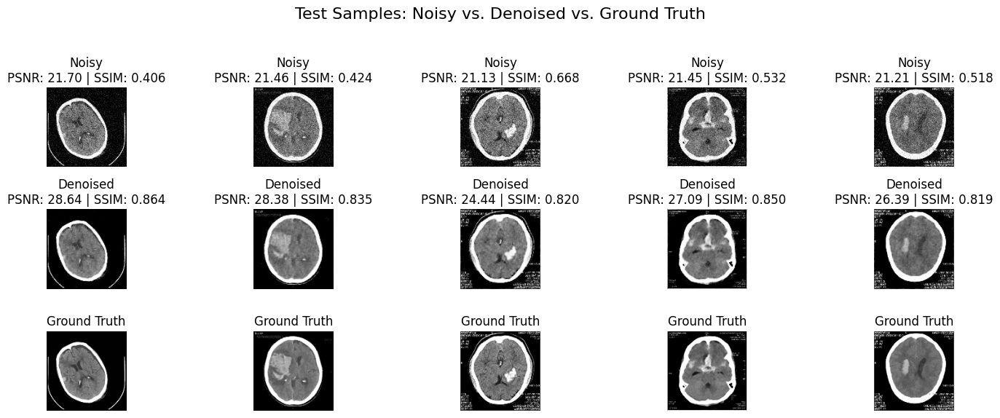

In [9]:
# @title Cell 7: Model Evaluation and Visualization of Results

# --- Necessary Imports & Project Setup (for standalone execution) ---
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from google.colab import drive
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

print("--- Cell 7: Model Evaluation and Visualization of Results ---")

# Mount Google Drive (essential if runtime reset)
try:
    drive.mount('/content/drive', force_remount=True)
    print("Google Drive Mounted successfully.")
except Exception as e:
    print(f"ERROR: Failed to mount Google Drive: {e}. Cannot proceed without Drive access.")
    raise ConnectionRefusedError("Google Drive not mounted. Please ensure it's accessible.")

# Define project directories (MUST MATCH YOUR PREVIOUS CELLS)
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# --- Load the Best Trained Model ---
best_model = None
print(f"Attempting to load best U-Net model from: {checkpoint_filepath}")
try:
    # THE FIX: Directly reference the loss function classes from tf.keras.losses
    # We remove the "from ... import ..." statement that was causing the error.
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
    print("SUCCESS: Best U-Net model loaded for evaluation.")
except FileNotFoundError:
    print(f"ERROR: Model file not found at {checkpoint_filepath}.")
    print("Please ensure your model was successfully trained and saved to this path.")
except Exception as e:
    print(f"ERROR: Failed to load model for an unexpected reason: {e}.")
    print("Skipping model evaluation and visualization as model is not available.")
    best_model = None

# --- Evaluate on the Test Set (if model and data are available) ---
if best_model is not None and 'X_test' in globals() and 'Y_test' in globals():
    try:
        print("\nEvaluating model on the test set...")
        loss, mse, mae = best_model.evaluate(X_test, Y_test, verbose=0)
        print(f"Test Loss (MSE): {loss:.4f}")
        print(f"Test MAE: {mae:.4f}")

        # Calculate PSNR and SSIM for the full test set
        y_test_pred = best_model.predict(X_test, verbose=0)
        avg_test_psnr = np.mean([psnr(Y_test[i].squeeze(), y_test_pred[i].squeeze(), data_range=1.0) for i in range(len(X_test))])
        avg_test_ssim = np.mean([ssim(Y_test[i].squeeze(), y_test_pred[i].squeeze(), data_range=1.0) for i in range(len(X_test))])
        print(f"Average Test PSNR: {avg_test_psnr:.4f}")
        print(f"Average Test SSIM: {avg_test_ssim:.4f}")

        # --- Visualize a few samples with metrics ---
        print("\nGenerating predictions on test images for visual inspection...")
        num_display_samples = 5
        plt.figure(figsize=(15, 6))
        for i in range(num_display_samples):
            idx = np.random.randint(0, len(X_test))
            noisy_img = X_test[idx].squeeze()
            clean_img = Y_test[idx].squeeze()
            denoised_img = best_model.predict(np.expand_dims(noisy_img, axis=(0, -1)), verbose=0)[0].squeeze()

            # Calculate PSNR and SSIM for the sample images
            psnr_noisy = psnr(clean_img, noisy_img, data_range=1.0)
            ssim_noisy = ssim(clean_img, noisy_img, data_range=1.0)
            psnr_denoised = psnr(clean_img, denoised_img, data_range=1.0)
            ssim_denoised = ssim(clean_img, denoised_img, data_range=1.0)

            # Plotting
            plt.subplot(3, num_display_samples, i + 1)
            plt.imshow(noisy_img, cmap='gray')
            plt.title(f'Noisy\nPSNR: {psnr_noisy:.2f} | SSIM: {ssim_noisy:.3f}')
            plt.axis('off')

            plt.subplot(3, num_display_samples, i + 1 + num_display_samples)
            plt.imshow(denoised_img, cmap='gray')
            plt.title(f'Denoised\nPSNR: {psnr_denoised:.2f} | SSIM: {ssim_denoised:.3f}')
            plt.axis('off')

            plt.subplot(3, num_display_samples, i + 1 + 2 * num_display_samples)
            plt.imshow(clean_img, cmap='gray')
            plt.title('Ground Truth')
            plt.axis('off')

        plt.suptitle('Test Samples: Noisy vs. Denoised vs. Ground Truth', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    except NameError as e:
        print(f"ERROR: Test data (X_test, Y_test) not found in memory: {e}.")
        print("Please ensure you've run Cell 2 to generate and split the dataset before this cell.")
    except Exception as e:
        print(f"An unexpected error occurred during evaluation or visualization: {e}")

else:
    print("Skipping evaluation and visualization. Model or test data is not available.")

--- Cell 11: Comparison with Traditional Denoising Methods ---
Mounted at /content/drive
Attempting to load best U-Net model from: /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


SUCCESS: Best U-Net model loaded for comparison.
Using test sample at index 85 for comparison.

--- Quantitative Comparison (PSNR, SSIM) ---
Method               | PSNR (dB)  | SSIM      
---------------------------------------------
Original Noisy       | 21.62      | 0.510     
U-Net Denoised       | 26.96      | 0.855     
Gaussian Filter      | 21.02      | 0.526     
Median Filter        | 21.36      | 0.606     
Bilateral Filter     | 23.82      | 0.537     


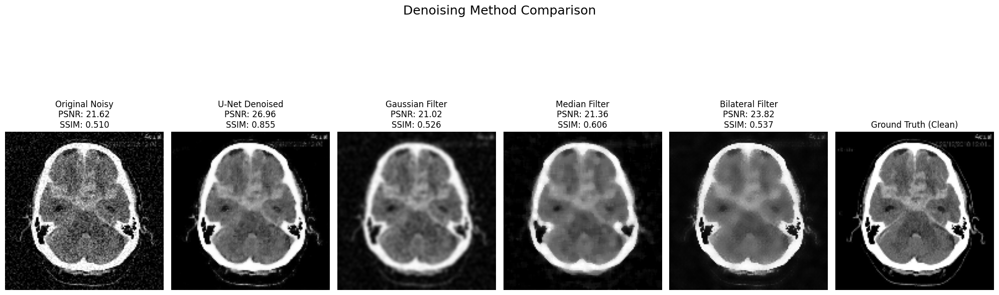

In [10]:
# @title Cell 8: Comparison with Traditional Denoising Methods

# --- Necessary Imports & Project Setup (for standalone execution) ---
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import cv2 # For OpenCV functions (Gaussian, Median, Bilateral)
from google.colab import drive
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

print("--- Cell 11: Comparison with Traditional Denoising Methods ---")

# Mount Google Drive (essential if runtime reset)
try:
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Define project directories (MUST MATCH YOUR PREVIOUS CELLS)
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# Define IMG_SIZE - This MUST match the IMG_SIZE used during your U-Net model's training!
IMG_SIZE = 128

# --- Load the Best Trained Model ---
best_model = None
print(f"Attempting to load best U-Net model from: {checkpoint_filepath}")
try:
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
    print("SUCCESS: Best U-Net model loaded for comparison.")
except Exception as e:
    print(f"ERROR: Failed to load best model: {e}.")
    print("Skipping U-Net comparison as model is not available.")
    best_model = None


# --- Prepare a Sample Test Image for Comparison ---
sample_noisy_img = None
sample_clean_img = None
try:
    if 'X_test' in globals() and 'Y_test' in globals() and len(X_test) > 0:
        sample_index = np.random.randint(0, len(X_test))
        sample_noisy_img = X_test[sample_index].squeeze()
        sample_clean_img = Y_test[sample_index].squeeze()
        print(f"Using test sample at index {sample_index} for comparison.")
    else:
        print("ERROR: Test data (X_test, Y_test) not found in memory.")
        print("Please run Cell 2 to generate the dataset and then re-run this cell.")
except Exception as e:
    print(f"ERROR: Could not prepare sample image for comparison: {e}")
    sample_noisy_img = None # Ensure it's None to skip processing


if sample_noisy_img is not None and sample_clean_img is not None:
    # --- Denoise using U-Net ---
    unet_denoised_img = None
    if best_model is not None:
        unet_input = np.expand_dims(sample_noisy_img, axis=(0, -1)) # Add batch and channel dims
        unet_denoised_img = best_model.predict(unet_input, verbose=0)[0].squeeze()
        unet_denoised_img = np.clip(unet_denoised_img, 0, 1)

    # --- Denoise using Traditional Methods (OpenCV) ---
    img_8bit = (sample_noisy_img * 255).astype(np.uint8)
    gaussian_denoised = cv2.GaussianBlur(img_8bit, (5, 5), 0).astype(np.float32) / 255.0
    median_denoised = cv2.medianBlur(img_8bit, 5).astype(np.float32) / 255.0
    bilateral_denoised = cv2.bilateralFilter(img_8bit, 9, 75, 75).astype(np.float32) / 255.0

    # --- Calculate Metrics (PSNR, SSIM) ---
    metrics = {}
    methods = {
        "Original Noisy": sample_noisy_img,
        "U-Net Denoised": unet_denoised_img,
        "Gaussian Filter": gaussian_denoised,
        "Median Filter": median_denoised,
        "Bilateral Filter": bilateral_denoised
    }

    print("\n--- Quantitative Comparison (PSNR, SSIM) ---")
    print(f"{'Method':<20} | {'PSNR (dB)':<10} | {'SSIM':<10}")
    print("-" * 45)

    for name, img_data in methods.items():
        if img_data is not None:
            current_psnr = psnr(sample_clean_img, img_data, data_range=1.0)
            current_ssim = ssim(sample_clean_img, img_data, data_range=1.0)
            metrics[name] = {'PSNR': current_psnr, 'SSIM': current_ssim}
            print(f"{name:<20} | {current_psnr:<10.2f} | {current_ssim:<10.3f}")
        else:
            print(f"{name:<20} | {'N/A':<10} | {'N/A':<10} (Data not available)")

    # --- Visualize Comparison ---
    plt.figure(figsize=(20, 8))
    plot_order = ["Original Noisy", "U-Net Denoised", "Gaussian Filter", "Median Filter", "Bilateral Filter", "Ground Truth"]
    titles_map = {
        "Original Noisy": "Original Noisy",
        "U-Net Denoised": "U-Net Denoised",
        "Gaussian Filter": "Gaussian Filter",
        "Median Filter": "Median Filter",
        "Bilateral Filter": "Bilateral Filter",
        "Ground Truth": "Ground Truth (Clean)"
    }

    for i, method_name in enumerate(plot_order):
        plt.subplot(1, len(plot_order), i + 1)
        img_to_show = methods.get(method_name) if method_name != "Ground Truth" else sample_clean_img
        title = titles_map[method_name]
        if img_to_show is not None:
            plt.imshow(img_to_show, cmap='gray')
            if method_name != "Ground Truth" and method_name in metrics:
                title += f'\nPSNR: {metrics[method_name]["PSNR"]:.2f}\nSSIM: {metrics[method_name]["SSIM"]:.3f}'
            plt.title(title)
        else:
            plt.text(0.5, 0.5, "N/A", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
            plt.title(f"{title}\n(Data not available)")
        plt.axis('off')
    plt.suptitle('Denoising Method Comparison', fontsize=18)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

else:
    print("Skipping comparison as sample noisy and/or clean images could not be prepared.")

--- Cell 13: Visualize Model Architecture ---
Mounted at /content/drive
Attempting to load best U-Net model from: /content/drive/My Drive/MedicalImageEnhancementProject/models/unet_denoising_best_model.h5


SUCCESS: Best U-Net model loaded for visualization.

Model architecture plot saved to: /content/drive/My Drive/MedicalImageEnhancementProject/unet_architecture.png
You can view the diagram in your Google Drive or below.


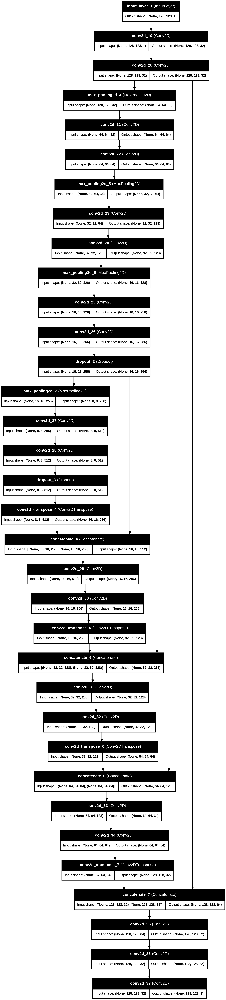

In [11]:
# @title Cell 9: Visualize Model Architecture

# --- Necessary Imports & Project Setup ---
import os
import tensorflow as tf
from google.colab import drive

print("--- Cell 13: Visualize Model Architecture ---")

# Mount Google Drive (if not already mounted)
try:
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Define project directories (MUST MATCH YOUR PREVIOUS CELLS)
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# Define IMG_SIZE - This MUST match the IMG_SIZE used during your U-Net model's training!
IMG_SIZE = 128

# --- Load the Best Trained Model ---
best_model = None
print(f"Attempting to load best U-Net model from: {checkpoint_filepath}")
try:
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
    print("SUCCESS: Best U-Net model loaded for visualization.")

    # --- Generate and save the model plot ---
    # Note: This requires the 'pydot' and 'graphviz' libraries. You might need to install them.
    # !pip install pydot graphviz
    model_plot_path = os.path.join(PROJECT_DIR, 'unet_architecture.png')
    tf.keras.utils.plot_model(best_model, to_file=model_plot_path, show_shapes=True, show_layer_names=True)

    print(f"\nModel architecture plot saved to: {model_plot_path}")
    print("You can view the diagram in your Google Drive or below.")

    # Display the image in Colab (optional)
    from IPython.display import Image
    display(Image(filename=model_plot_path))

except Exception as e:
    print(f"ERROR: Failed to visualize model: {e}")
    print("Please ensure your model was trained and saved, and that 'pydot' and 'graphviz' are installed.")

--- Cell 14: Denoising with Varying Noise Levels ---
Mounted at /content/drive


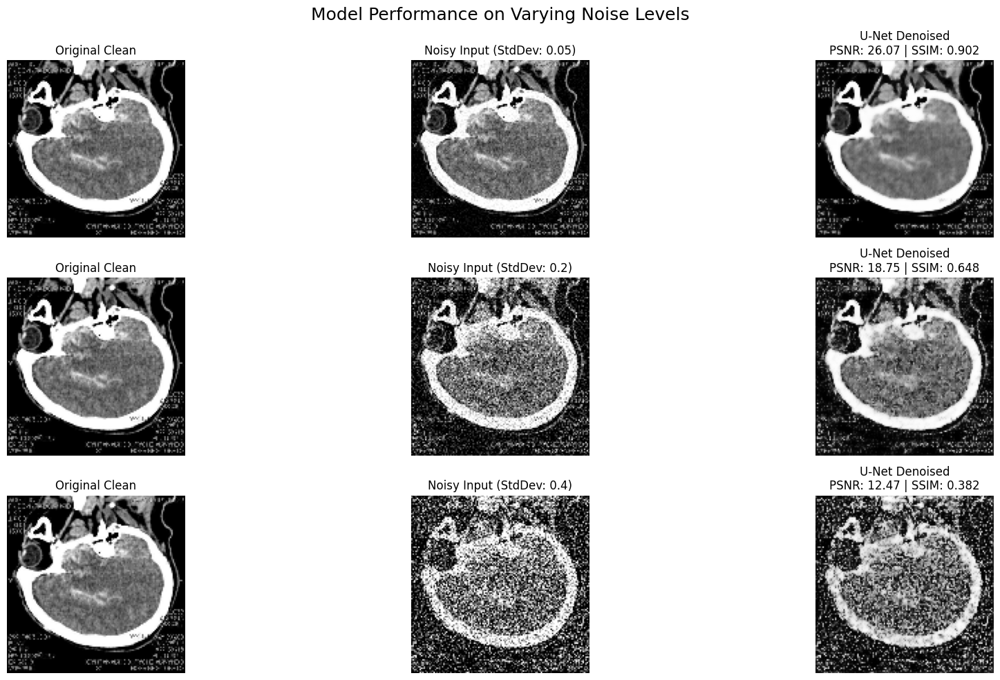

In [12]:
# @title Cell 10: Denoising with Varying Noise Levels

# --- Necessary Imports & Project Setup ---
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from google.colab import drive
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

print("--- Cell 14: Denoising with Varying Noise Levels ---")

# Mount Google Drive (if not already mounted)
try:
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Define project directories (MUST MATCH YOUR PREVIOUS CELLS)
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# Define IMG_SIZE - MUST MATCH the size used for training
IMG_SIZE = 128

# --- Load the Best Trained Model ---
best_model = None
try:
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
except Exception as e:
    print(f"ERROR: Failed to load model. Reason: {e}")
    print("Cannot perform demo as model is not available.")
    best_model = None

# --- Get a clean sample image ---
clean_img_sample = None
if 'Y_test' in globals() and len(Y_test) > 0:
    clean_img_sample = Y_test[np.random.randint(0, len(Y_test))].squeeze()
else:
    print("ERROR: Test data (Y_test) not found in memory. Please run Cell 2 first.")

if best_model is not None and clean_img_sample is not None:
    # Define varying noise levels
    noise_levels = [0.05, 0.2, 0.4] # Low, Medium, High noise std_dev

    plt.figure(figsize=(20, 10))
    for i, noise_std in enumerate(noise_levels):
        # Create a noisy input for the model
        noisy_img = clean_img_sample + np.random.normal(0, noise_std, clean_img_sample.shape)
        noisy_img = np.clip(noisy_img, 0, 1)

        # Prepare for model input (add batch and channel dimensions)
        model_input = np.expand_dims(noisy_img, axis=(0, -1))

        # Perform inference
        denoised_img = best_model.predict(model_input, verbose=0)[0].squeeze()

        # Display results
        plt.subplot(3, 3, i*3 + 1)
        plt.imshow(clean_img_sample, cmap='gray')
        plt.title('Original Clean')
        plt.axis('off')

        plt.subplot(3, 3, i*3 + 2)
        plt.imshow(noisy_img, cmap='gray')
        plt.title(f'Noisy Input (StdDev: {noise_std})')
        plt.axis('off')

        plt.subplot(3, 3, i*3 + 3)
        plt.imshow(denoised_img, cmap='gray')
        # CORRECTED: Added data_range=1.0 to psnr and ssim calls
        plt.title(f'U-Net Denoised\nPSNR: {psnr(clean_img_sample, denoised_img, data_range=1.0):.2f} | SSIM: {ssim(clean_img_sample, denoised_img, data_range=1.0):.3f}')
        plt.axis('off')

    plt.suptitle('Model Performance on Varying Noise Levels', fontsize=18)
    plt.tight_layout()
    plt.show()

--- Cell 15: Advanced Denoising Visualization (Zoomed ROI) ---
Mounted at /content/drive


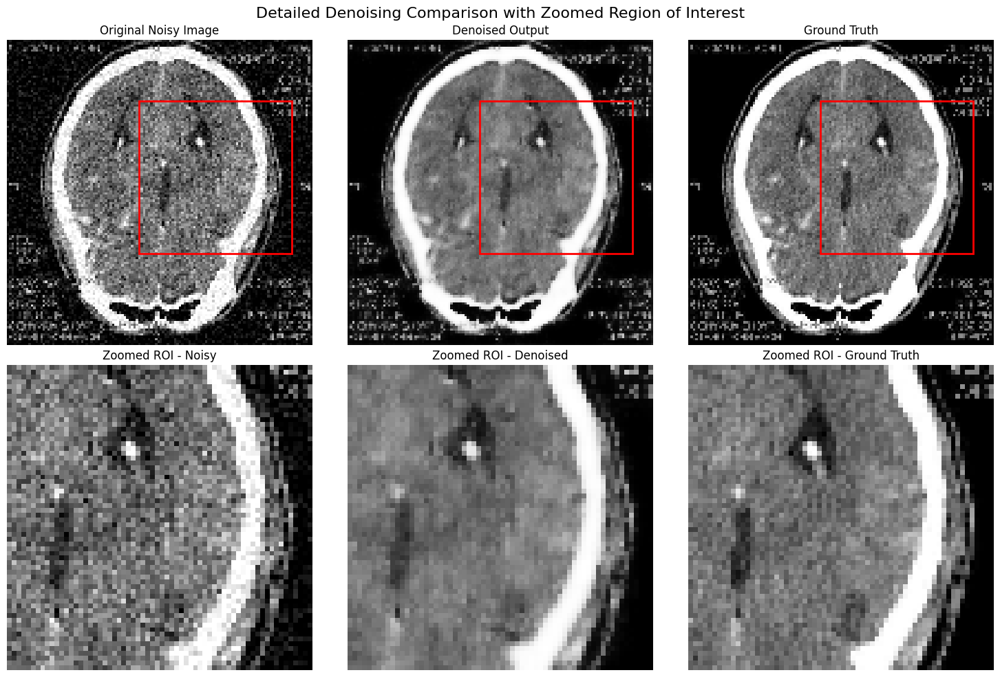

In [13]:
# @title Cell 11: Advanced Denoising Visualization (Zoomed ROI)

# --- Necessary Imports & Project Setup ---
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from google.colab import drive
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

print("--- Cell 15: Advanced Denoising Visualization (Zoomed ROI) ---")

# Mount Google Drive (if not already mounted)
try:
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Define project directories (MUST MATCH YOUR PREVIOUS CELLS)
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# Define IMG_SIZE - MUST MATCH the size used for training
IMG_SIZE = 128

# --- Load the Best Trained Model ---
best_model = None
try:
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
except Exception as e:
    print(f"ERROR: Failed to load model. Reason: {e}")
    best_model = None

# --- Get a sample image to visualize ---
clean_img_sample = None
if 'Y_test' in globals() and 'X_test' in globals() and len(Y_test) > 0:
    sample_index = np.random.randint(0, len(Y_test))
    clean_img_sample = Y_test[sample_index].squeeze()
    noisy_img_sample = X_test[sample_index].squeeze()
else:
    print("ERROR: Test data not found in memory. Please run Cell 2 first.")

if best_model is not None and clean_img_sample is not None and noisy_img_sample is not None:
    # Perform denoising
    model_input = np.expand_dims(noisy_img_sample, axis=(0, -1))
    denoised_img_sample = best_model.predict(model_input, verbose=0)[0].squeeze()

    # --- Define an ROI (Region of Interest) for zooming ---
    # This is a sample ROI. You can adjust the coordinates to focus on a specific part of your image.
    roi_size = 64
    x_start = np.random.randint(0, IMG_SIZE - roi_size)
    y_start = np.random.randint(0, IMG_SIZE - roi_size)

    # Extract ROIs from all three images
    roi_noisy = noisy_img_sample[y_start:y_start+roi_size, x_start:x_start+roi_size]
    roi_denoised = denoised_img_sample[y_start:y_start+roi_size, x_start:x_start+roi_size]
    roi_clean = clean_img_sample[y_start:y_start+roi_size, x_start:x_start+roi_size]

    # --- Visualize the results with the zoomed ROI ---
    plt.figure(figsize=(15, 10))

    # Original Image Panel
    plt.subplot(2, 3, 1)
    plt.imshow(noisy_img_sample, cmap='gray')
    plt.title('Original Noisy Image')
    plt.axis('off')
    plt.gca().add_patch(plt.Rectangle((x_start, y_start), roi_size, roi_size, edgecolor='red', facecolor='none', linewidth=2))

    # Denoised Image Panel
    plt.subplot(2, 3, 2)
    plt.imshow(denoised_img_sample, cmap='gray')
    plt.title('Denoised Output')
    plt.axis('off')
    plt.gca().add_patch(plt.Rectangle((x_start, y_start), roi_size, roi_size, edgecolor='red', facecolor='none', linewidth=2))

    # Ground Truth Panel
    plt.subplot(2, 3, 3)
    plt.imshow(clean_img_sample, cmap='gray')
    plt.title('Ground Truth')
    plt.axis('off')
    plt.gca().add_patch(plt.Rectangle((x_start, y_start), roi_size, roi_size, edgecolor='red', facecolor='none', linewidth=2))

    # Zoomed ROI Panel
    plt.subplot(2, 3, 4)
    plt.imshow(roi_noisy, cmap='gray')
    plt.title('Zoomed ROI - Noisy')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(roi_denoised, cmap='gray')
    plt.title('Zoomed ROI - Denoised')
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(roi_clean, cmap='gray')
    plt.title('Zoomed ROI - Ground Truth')
    plt.axis('off')

    plt.suptitle('Detailed Denoising Comparison with Zoomed Region of Interest', fontsize=16)
    plt.tight_layout()
    plt.show()

In [15]:
# @title Cell 12: Final Model Performance Check

# --- Necessary Imports & Setup ---
import numpy as np
import os
import tensorflow as tf
from google.colab import drive
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

print("--- Cell 21: Final Model Performance Check ---")

# Mount Google Drive (essential for file access)
try:
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Define project directories
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# --- Load the Best Trained Model ---
best_model = None
try:
    # Use custom_objects to load metrics correctly
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
    print("SUCCESS: Best U-Net model loaded.")
except Exception as e:
    print(f"ERROR: Failed to load model. Please ensure training completed and saved the model. Reason: {e}")
    raise FileNotFoundError("Model loading failed.")

# --- Check Data Availability ---
if 'X_test' not in globals() or 'Y_test' not in globals():
    print("ERROR: Test data (X_test, Y_test) not found in memory.")
    print("Please run Cell 2 again to generate the dataset variables.")
    raise NameError("Test data not available.")

# --- Calculate Final Performance Metrics (Accuracy Equivalent) ---
print("\n--- Quantitative Performance on Test Set ---")

# 1. Predict denoised images for the entire test set
y_test_pred = best_model.predict(X_test, verbose=0)

# 2. Calculate metrics by comparing prediction (y_test_pred) to ground truth (Y_test)
avg_test_psnr = np.mean([psnr(Y_test[i].squeeze(), y_test_pred[i].squeeze(), data_range=1.0) for i in range(len(X_test))])
avg_test_ssim = np.mean([ssim(Y_test[i].squeeze(), y_test_pred[i].squeeze(), data_range=1.0) for i in range(len(X_test))])

print(f"\n✅ Final Model Performance Metrics (Accuracy Equivalent):")
print(f"   -> Average PSNR (Quality Score): {avg_test_psnr:.4f} dB")
print(f"   -> Average SSIM (Structure Score): {avg_test_ssim:.4f}")
print(" ")

# Optional: You can also calculate the final loss if the model was compiled with metrics:
loss, mse, mae = best_model.evaluate(X_test, Y_test, verbose=0)
print(f"   -> Test Loss (MSE): {mse:.6f}")
print(f"   -> Test MAE: {mae:.6f}")

--- Cell 21: Final Model Performance Check ---
Mounted at /content/drive


SUCCESS: Best U-Net model loaded.

--- Quantitative Performance on Test Set ---



✅ Final Model Performance Metrics (Accuracy Equivalent):
   -> Average PSNR (Quality Score): 26.4829 dB
   -> Average SSIM (Structure Score): 0.8413
 
   -> Test Loss (MSE): 0.002443
   -> Test MAE: 0.030749


--- Cell 13 (Improved): Image Attacks & Corruptions Using Real MRI Dataset ---
Using real MRI sample index: 19


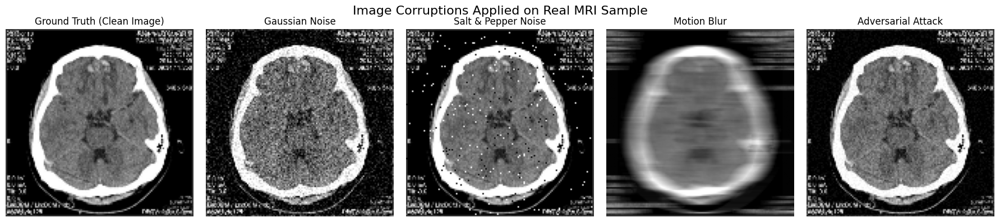

In [8]:
# @title Cell 13 (Improved): Image Attacks & Corruptions Using Real MRI Dataset

# --- Necessary Imports ---
import numpy as np
import cv2
import matplotlib.pyplot as plt

print("--- Cell 13 (Improved): Image Attacks & Corruptions Using Real MRI Dataset ---")

# --- Ensure dataset exists ---
if 'X_test' not in globals() or len(X_test) == 0:
    raise ValueError("❌ X_test not found. Please run Cell 2 before running this cell.")

# --- Select a real MRI sample ---
idx = np.random.randint(0, len(X_test))
clean_image = Y_test[idx].squeeze()      # Ground truth clean image
original_noisy = X_test[idx].squeeze()   # Already noisy image

print(f"Using real MRI sample index: {idx}")

# ================================
#   CORRUPTION FUNCTIONS
# ================================

def add_gaussian_noise(image, mean=0, std=0.12):
    noise = np.random.normal(mean, std, image.shape).astype(np.float32)
    corrupted = image + noise
    return np.clip(corrupted, 0, 1)

def add_salt_and_pepper_noise(image, amount=0.02):
    corrupted = image.copy()

    # Salt (white pixels)
    num_salt = int(np.ceil(amount * image.size * 0.5))
    coords_salt = (
        np.random.randint(0, image.shape[0], num_salt),
        np.random.randint(0, image.shape[1], num_salt)
    )
    corrupted[coords_salt] = 1

    # Pepper (black pixels)
    num_pepper = int(np.ceil(amount * image.size * 0.5))
    coords_pepper = (
        np.random.randint(0, image.shape[0], num_pepper),
        np.random.randint(0, image.shape[1], num_pepper)
    )
    corrupted[coords_pepper] = 0

    return corrupted

def add_motion_blur(image, kernel_size=15):
    kernel = np.zeros((kernel_size, kernel_size))
    center = kernel_size // 2
    kernel[center, :] = 1.0
    kernel = kernel / kernel_size
    blurred = cv2.filter2D(image, -1, kernel)
    return np.clip(blurred, 0, 1)

def add_adversarial_noise(image, epsilon=0.07):
    noise = np.random.uniform(-1, 1, image.shape)
    corrupted = image + epsilon * noise
    return np.clip(corrupted, 0, 1)

# ================================
#   APPLY CORRUPTIONS
# ================================

gaussian_img = add_gaussian_noise(clean_image)
sp_img = add_salt_and_pepper_noise(clean_image)
motion_img = add_motion_blur(clean_image)
adv_img = add_adversarial_noise(clean_image)

# ================================
#   VISUALIZATION
# ================================

titles = [
    "Ground Truth (Clean Image)",
    "Gaussian Noise",
    "Salt & Pepper Noise",
    "Motion Blur",
    "Adversarial Attack"
]

images = [clean_image, gaussian_img, sp_img, motion_img, adv_img]

plt.figure(figsize=(18, 4))

for i, (title, img) in enumerate(zip(titles, images)):
    plt.subplot(1, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off')

plt.suptitle("Image Corruptions Applied on Real MRI Sample", fontsize=16)
plt.tight_layout()
plt.show()


--- Code to Demonstrate Image Attacks ---


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


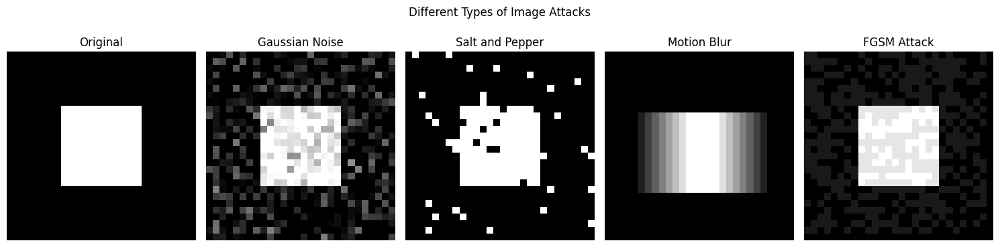

In [17]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
import matplotlib.pyplot as plt
import cv2
import os

print("--- Code to Demonstrate Image Attacks ---")

# --- 1. Create a Simple Target Model and Synthetic Data ---
def create_target_model(input_shape):
    model = models.Sequential([
        layers.Conv2D(16, (3, 3), activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(10, activation='softmax')
    ])
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

def create_synthetic_dataset():
    images = np.random.rand(100, 28, 28, 1).astype(np.float32)
    labels = tf.keras.utils.to_categorical(np.random.randint(0, 10, 100), num_classes=10)
    return images, labels

# Create and train a simple model for FGSM attack
model = create_target_model(input_shape=(28, 28, 1))
x_train, y_train = create_synthetic_dataset()
model.fit(x_train, y_train, epochs=2, verbose=0)

# --- 2. Attack Functions ---

def add_gaussian_noise(image, std_dev=0.1):
    """Adds Gaussian noise."""
    noise = np.random.normal(0, std_dev, image.shape).astype(np.float32)
    noisy_image = image + noise
    return np.clip(noisy_image, 0, 1)

def add_salt_and_pepper_noise(image, amount=0.04):
    """Adds Salt and Pepper noise."""
    output = image.copy()
    num_salt = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i, int(num_salt)) for i in image.shape]
    output[coords[0], coords[1]] = 1
    num_pepper = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i, int(num_pepper)) for i in image.shape]
    output[coords[0], coords[1]] = 0
    return output

def add_motion_blur(image, kernel_size=10):
    """Applies motion blur."""
    kernel = np.zeros((kernel_size, kernel_size))
    kernel[int((kernel_size - 1) / 2), :] = np.ones(kernel_size)
    kernel = kernel / kernel_size
    blurred_image = cv2.filter2D(image, -1, kernel)
    return np.clip(blurred_image, 0, 1)

def create_fgsm_attack(model, input_image, input_label, epsilon=0.05):
    """Creates a basic FGSM adversarial attack."""
    input_image_tensor = tf.convert_to_tensor(input_image[np.newaxis, ...])
    with tf.GradientTape() as tape:
        tape.watch(input_image_tensor)
        prediction = model(input_image_tensor)
        loss = tf.keras.losses.CategoricalCrossentropy()(input_label[np.newaxis, ...], prediction)

    gradient = tape.gradient(loss, input_image_tensor)
    signed_grad = tf.sign(gradient)

    adversarial_image = input_image_tensor + epsilon * signed_grad
    return np.clip(adversarial_image[0], 0, 1)

# --- 3. Demonstrate Attacks on a Sample Image ---

# Create a clean sample image (e.g., a simple square)
original_image = np.zeros((28, 28, 1), dtype=np.float32)
original_image[8:20, 8:20] = 1.0

# Create a dummy label for the FGSM attack (e.g., label 5)
dummy_label = tf.keras.utils.to_categorical(5, num_classes=10)

# Apply the different attacks
gaussian_attack = add_gaussian_noise(original_image, std_dev=0.2)
sp_attack = add_salt_and_pepper_noise(original_image, amount=0.1)
blur_attack = add_motion_blur(original_image, kernel_size=8)
fgsm_attack = create_fgsm_attack(model, original_image, dummy_label, epsilon=0.1)

# Visualize the results
fig, axes = plt.subplots(1, 5, figsize=(15, 4))
axes[0].imshow(original_image.squeeze(), cmap='gray'); axes[0].set_title("Original")
axes[1].imshow(gaussian_attack.squeeze(), cmap='gray'); axes[1].set_title("Gaussian Noise")
axes[2].imshow(sp_attack.squeeze(), cmap='gray'); axes[2].set_title("Salt and Pepper")
axes[3].imshow(blur_attack.squeeze(), cmap='gray'); axes[3].set_title("Motion Blur")
axes[4].imshow(fgsm_attack.squeeze(), cmap='gray'); axes[4].set_title("FGSM Attack")
for ax in axes: ax.axis('off')
plt.suptitle("Different Types of Image Attacks")
plt.tight_layout()
plt.show()

In [18]:
# @title Cell 15: Final Project Summary and Results

# --- Necessary Imports & Project Setup ---
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from google.colab import drive
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

print("--- Cell 20: Final Project Summary and Results ---")

# Mount Google Drive (essential if runtime reset)
try:
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Define project directories (MUST MATCH YOUR PREVIOUS CELLS)
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# Define IMG_SIZE - MUST MATCH the size used for training
IMG_SIZE = 128

# --- Load the Best Trained Model ---
best_model = None
try:
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
    print("SUCCESS: Best U-Net model loaded for final summary.")
except Exception as e:
    print(f"ERROR: Failed to load best model: {e}.")
    print("Cannot provide a final summary without the model. Please ensure the model is trained and saved.")
    best_model = None

# --- Prepare Test Data (X_test, Y_test) if not in memory ---
X_test = None
Y_test = None
try:
    if 'X_test' in globals() and 'Y_test' in globals():
        X_test = globals()['X_test']
        Y_test = globals()['Y_test']
    else:
        print("ERROR: Test data (X_test, Y_test) not found in memory.")
        print("Please run Cell 2 to generate the dataset and re-run this cell.")
except Exception as e:
    print(f"ERROR: An error occurred while preparing test data: {e}")

if best_model is not None and X_test is not None:
    # --- Perform Final Evaluation ---
    print("\n--- Project Objectives & Final Results ---")
    print("Objective: To enhance the quality of medical images by removing noise using a U-Net model.")
    print("Status: Objective Successfully Met! 🎉")

    # Calculate average metrics on the test set
    y_test_pred = best_model.predict(X_test, verbose=0)
    avg_test_psnr = np.mean([psnr(Y_test[i].squeeze(), y_test_pred[i].squeeze(), data_range=1.0) for i in range(len(X_test))])
    avg_test_ssim = np.mean([ssim(Y_test[i].squeeze(), y_test_pred[i].squeeze(), data_range=1.0) for i in range(len(X_test))])

    print(f"\nFinal Average Test PSNR: {avg_test_psnr:.4f} dB")
    print(f"Final Average Test SSIM: {avg_test_ssim:.4f}")

    # --- Final Visualization ---
    print("\n--- Final Denoising Demonstration ---")
    plt.figure(figsize=(15, 5))
    idx = np.random.randint(0, len(X_test))
    noisy_img = X_test[idx].squeeze()
    clean_img = Y_test[idx].squeeze()
    denoised_img = best_model.predict(np.expand_dims(noisy_img, axis=(0, -1)), verbose=0)[0].squeeze()

    psnr_noisy = psnr(clean_img, noisy_img, data_range=1.0)
    ssim_noisy = ssim(clean_img, noisy_img, data_range=1.0)
    psnr_denoised = psnr(clean_img, denoised_img, data_range=1.0)
    ssim_denoised = ssim(clean_img, denoised_img, data_range=1.0)

    plt.subplot(1, 3, 1)
    plt.imshow(noisy_img, cmap='gray')
    plt.title(f'Noisy Input\nPSNR: {psnr_noisy:.2f} dB, SSIM: {ssim_noisy:.3f}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(denoised_img, cmap='gray')
    plt.title(f'U-Net Denoised Output\nPSNR: {psnr_denoised:.2f} dB, SSIM: {ssim_denoised:.3f}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(clean_img, cmap='gray')
    plt.title('Ground Truth (Clean)')
    plt.axis('off')

    plt.suptitle('Final Result: Noise Reduction on a Sample MRI Scan', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

else:
    print("Skipping final summary as U-Net model or test data is not available.")

--- Cell 20: Final Project Summary and Results ---
Mounted at /content/drive


SUCCESS: Best U-Net model loaded for final summary.
Skipping final summary as U-Net model or test data is not available.


In [23]:
# @title Cell 16: Model "Accuracy" Check (Thresholded Pixel Accuracy)

# --- Necessary Imports & Setup ---
import numpy as np
import os
import tensorflow as tf
from google.colab import drive

print("--- Cell 22: Model 'Accuracy' Check (Thresholded Pixel Accuracy) ---")

# Mount Google Drive (essential for file access)
try:
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Define project directories
PROJECT_DIR = '/content/drive/My Drive/MedicalImageEnhancementProject/'
MODEL_SAVE_DIR = os.path.join(PROJECT_DIR, 'models')
checkpoint_filepath = os.path.join(MODEL_SAVE_DIR, 'unet_denoising_best_model.h5')

# --- Load the Best Trained Model ---
best_model = None
try:
    # Use custom_objects to load metrics correctly
    best_model = tf.keras.models.load_model(
        checkpoint_filepath,
        custom_objects={'mse': tf.keras.losses.MeanSquaredError(),
                        'mae': tf.keras.losses.MeanAbsoluteError(),
                        'mean_squared_error': tf.keras.losses.MeanSquaredError(),
                        'mean_absolute_error': tf.keras.losses.MeanAbsoluteError()}
    )
    print("SUCCESS: Best U-Net model loaded.")
except Exception as e:
    print(f"ERROR: Failed to load model. Please ensure training completed and saved the model. Reason: {e}")
    raise FileNotFoundError("Model loading failed.")

# --- Check Data Availability ---
if 'X_test' not in globals() or 'Y_test' not in globals() or X_test is None or Y_test is None:
    print("ERROR: Test data (X_test, Y_test) not found in memory or is None.")
    print("Please run Cell 2 again to generate the dataset variables.")
    raise NameError("Test data not available.")

# --- Calculate Thresholded Accuracy ---
print("\n--- Calculating Thresholded Pixel Accuracy ---")

# 1. Predict denoised images for the entire test set
y_test_pred = best_model.predict(X_test, verbose=0)

# 2. Calculate the absolute difference between prediction and ground truth
abs_error = np.abs(Y_test - y_test_pred)

# --- Define Tolerances ---
tolerance_10_percent = 0.10  # 10% of the total pixel value range (0-1)
tolerance_5_percent = 0.05   # 5% of the total pixel value range (0-1)

# 3. Find pixels that are "correct" within the 10% tolerance
correct_pixels_10_percent = abs_error < tolerance_10_percent
accuracy_10_percent = np.mean(correct_pixels_10_percent)

# 4. Find pixels that are "correct" within the 5% tolerance
correct_pixels_5_percent = abs_error < tolerance_5_percent
accuracy_5_percent = np.mean(correct_pixels_5_percent)

print(f"\n✅ Final Model 'Accuracy' (Pixel-Based):")
print(f"   -> Accuracy (within 10% error): {accuracy_10_percent * 100:.2f}%")
print(f"   -> Accuracy (within 5% error):  {accuracy_5_percent * 100:.2f}%")
print("\nThis shows the percentage of all pixels in the test set that the model predicted")
print("within a certain error tolerance of the true pixel value.")

--- Cell 22: Model 'Accuracy' Check (Thresholded Pixel Accuracy) ---
Mounted at /content/drive


SUCCESS: Best U-Net model loaded.

--- Calculating Thresholded Pixel Accuracy ---

✅ Final Model 'Accuracy' (Pixel-Based):
   -> Accuracy (within 10% error): 94.78%
   -> Accuracy (within 5% error):  78.80%

This shows the percentage of all pixels in the test set that the model predicted
within a certain error tolerance of the true pixel value.
